# Import Packages

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
%matplotlib inline

# Camera Calibration

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

<Figure size 1440x1440 with 0 Axes>

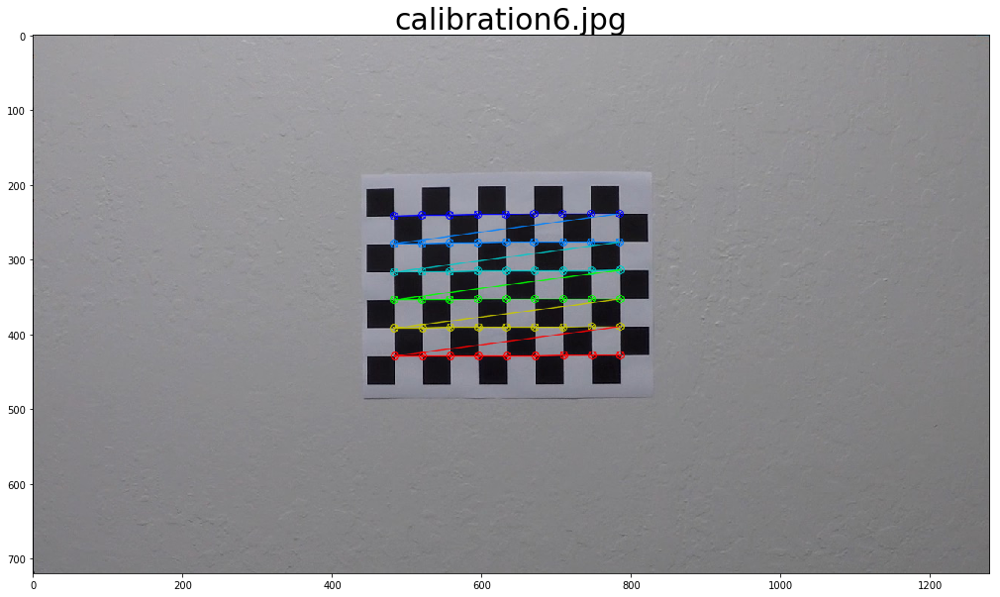

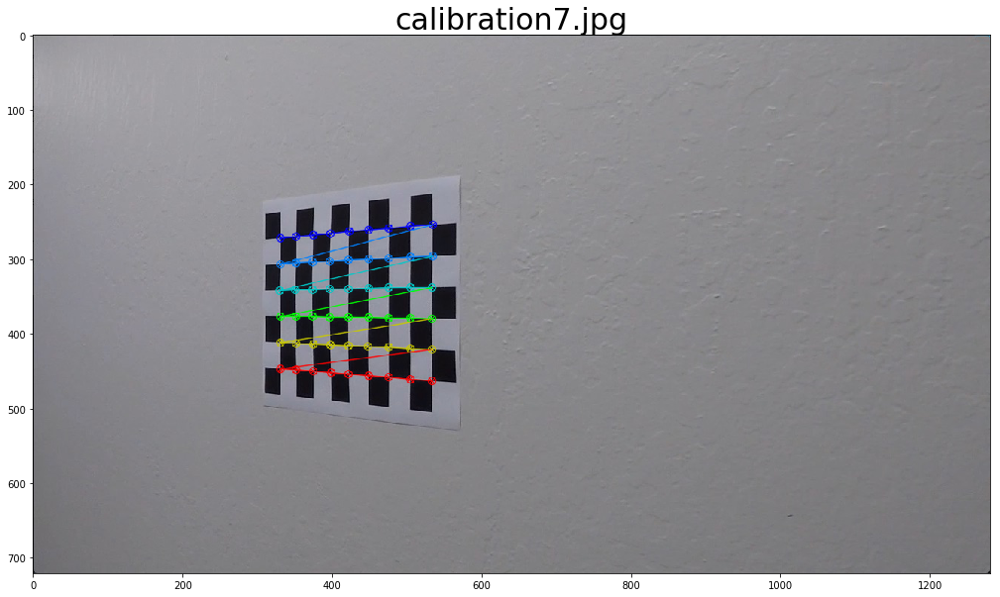

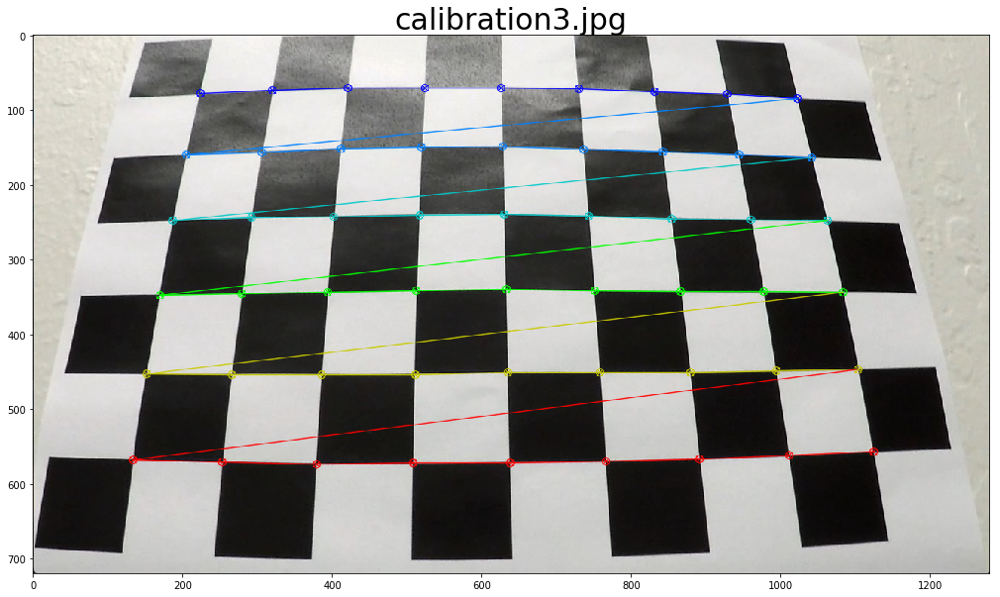

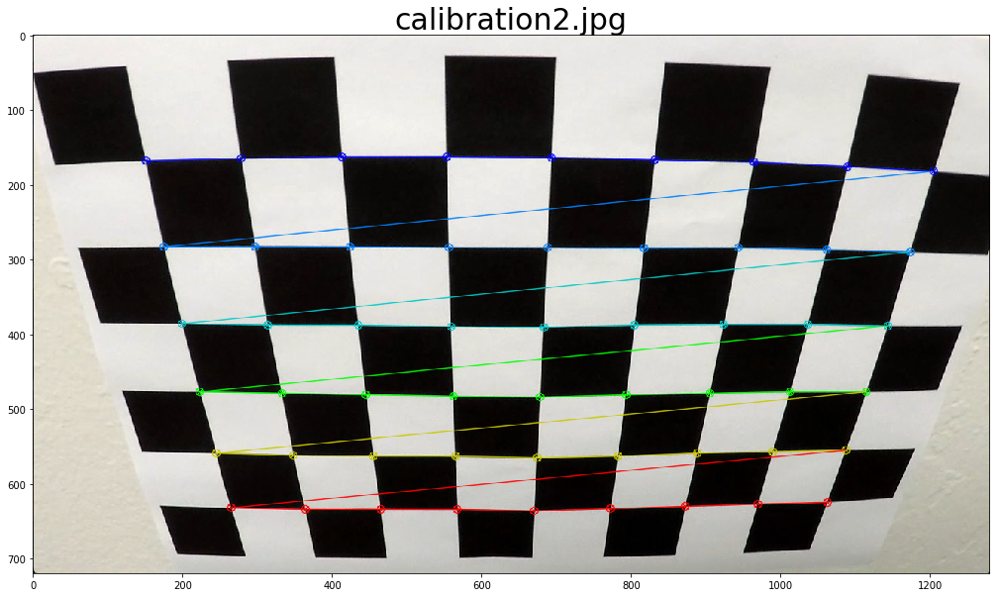

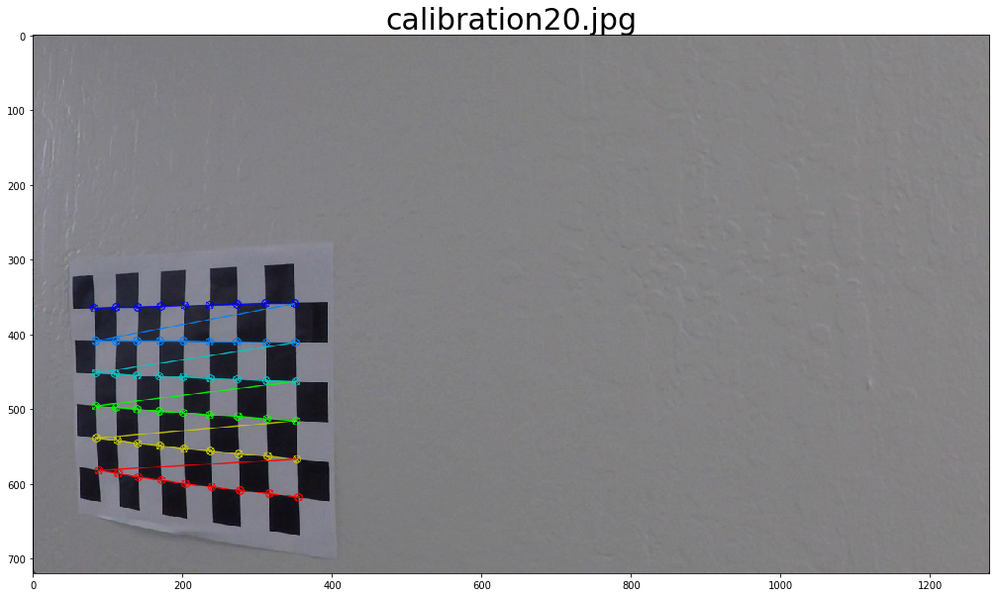

...

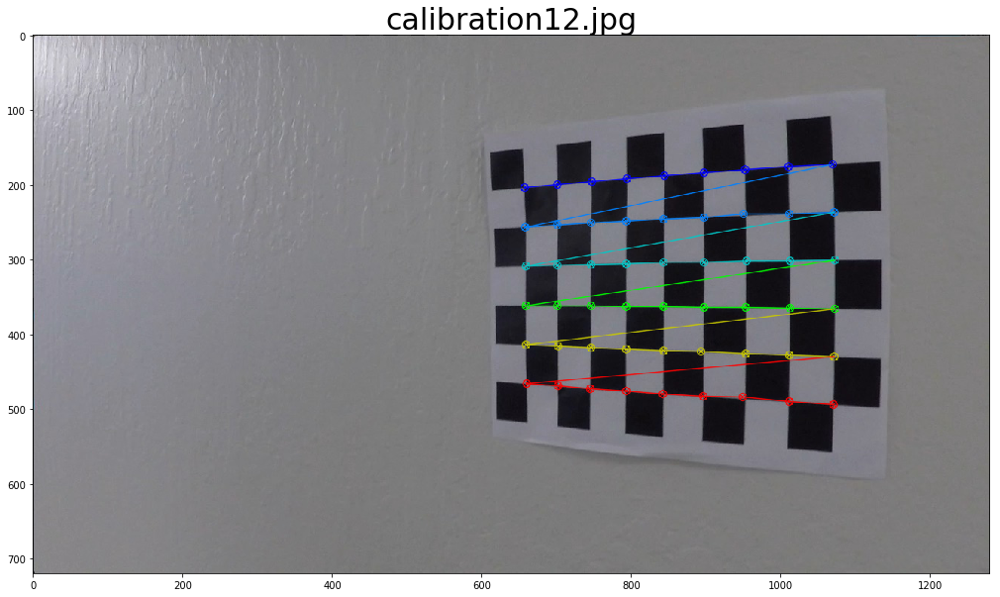

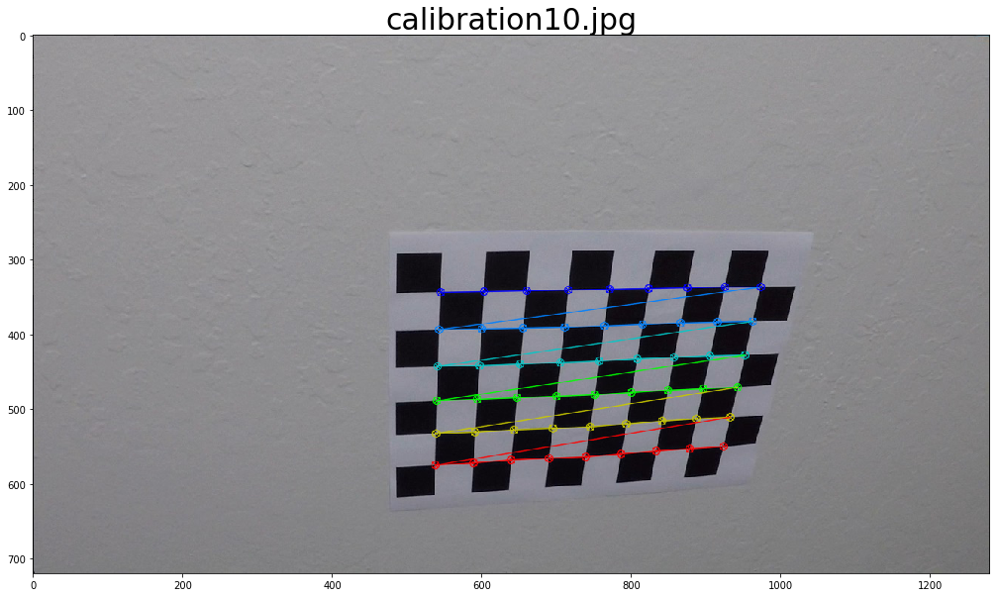

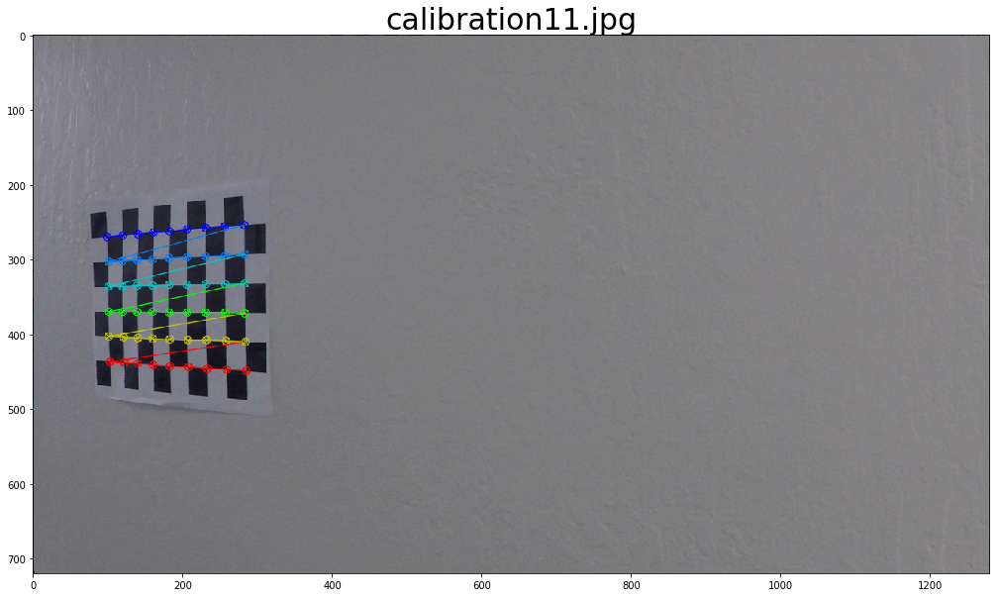

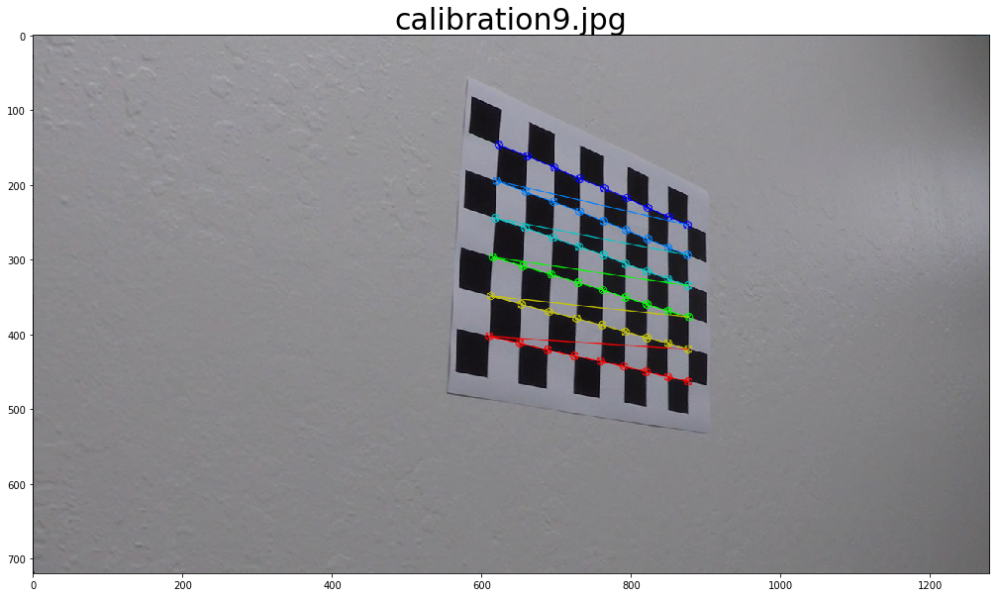

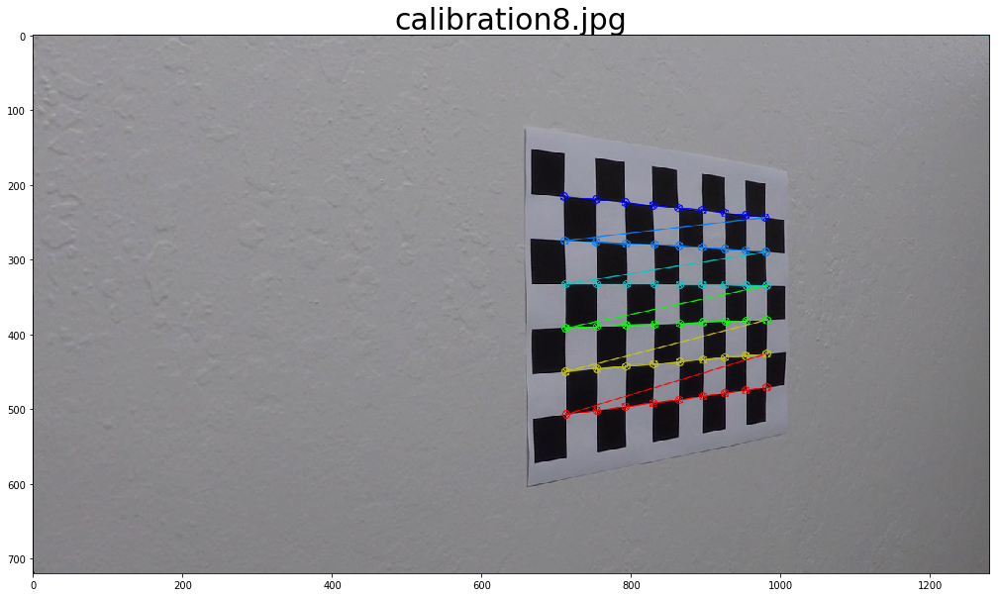

In [2]:
images = glob.glob("camera_cal/calibration*.jpg")
# Array to store object and image points from all the images
objpoints = []
imgpoints = []
m = 9
n = 6
objp = np.zeros((m * n, 3), np.float32)
objp[:, :2] = np.mgrid[0:m, 0:n].T.reshape(-1, 2)
# print(objp)
fig = plt.figure(figsize=(20, 20))
columns = 4
rows = 5

for i, fname in enumerate(images):
    img = mpimg.imread(fname)

    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the corners of chess board
    ret, corners = cv2.findChessboardCorners(gray, (m, n), None)

    # if corners are found, add points to object and img points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        img = cv2.drawChessboardCorners(img, (m, n), corners, ret)
        f, ax1 = plt.subplots(1, 1, figsize=(20,10))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(img)
        ax1.set_title(fname[11:], fontsize=30)
        
# Do camera calibration given object points and image points
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration.p", "wb" ) )

# Distortion Correction

- Apply a distortion correction to raw images.

- Before applying the undistort function on the image, we refine the camera matrix based on a free scaling parameter using cv2.getOptimalNewCameraMatrix(). If the scaling parameter alpha=0, it returns undistorted image with minimum unwanted pixels. So it may even remove some pixels at image corners. If alpha=1, all pixels are retained with some extra black images. It also returns an image ROI which can be used to crop the result.

- Notice that without the use of getOptimalNewCameraMatrix function to obtain the camera matrix of the distorted image, a large number of image pixels were being cropped out. This ensures we don't lose out any information from the original image.

- The function transforms an image to compensate radial and tangential lens distortion

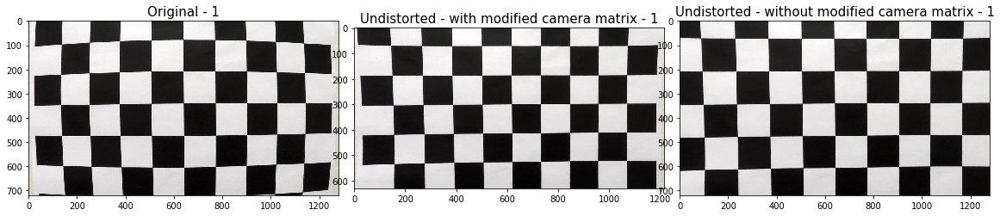

In [3]:
def cal_undistort(img, mtx, dist, nameRemove = 0, show=False, compareUndist=True):
    h,  w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(cameraMatrix = mtx, 
                                                      distCoeffs = dist,imageSize = (w,h),
                                                      alpha = 1, newImgSize =(w,h))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    dst1 = cv2.undistort(img, mtx, dist, None, newcameramtx)
    x,y,w,h = roi
    dst1 = dst1[y:y+h, x:x+w]
    if show:
        if compareUndist:
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
            ax3.imshow(dst)
            ax3.set_title('Undistorted - without modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
        else:
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(img)
        ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)
        ax2.imshow(dst1)
        ax2.set_title('Undistorted - with modified camera matrix - '+ fname[nameRemove:-4], fontsize=15)
    return dst1

images = glob.glob("camera_cal/calibration*.jpg")
for fname in images:
    img = mpimg.imread(fname)
    undist = cal_undistort(img, mtx, dist, nameRemove = len("camera_cal/calibration"), 
                           show = True if "calibration1.jpg" in fname else False)
    

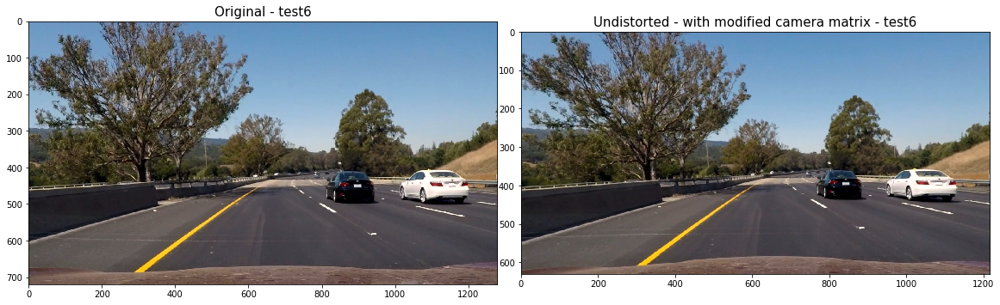

In [4]:
# Test undistortion on an image
test_images = glob.glob("test_images/*")

for fname in test_images:
    img = mpimg.imread(fname)
    n= len("test_images/")
    undist = cal_undistort(img, mtx, dist, nameRemove= n, 
                           show= True if "test6.jpg" in fname else False, compareUndist= False)
    cv2.imwrite("undist_images/" + fname[n:],cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))

# Thresholded binary image

Use color transforms, gradients, etc., to create a thresholded binary image

In [5]:
def hls_s_layer(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    return S

def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1 if orient == 'x' else 0, 0 if orient == 'x' else 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobelx = np.sqrt(sobelx**2)
    abs_sobely = np.sqrt(sobely**2) 
    grad = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad)
    binary_output[(grad > thresh[0]) & (grad < thresh[1])] = 1
    return binary_output

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def getThresholdImage(image):
    gray = hls_s_layer(image)

    thresh = (80, 255)
    R = image[:,:,0]
    R_binary = np.zeros_like(R)
    R_binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

    mag_binary = mag_thresh(gray, sobel_kernel=3, mag_thresh=(15, 150))
    dir_binary = dir_threshold(gray, sobel_kernel=15, thresh=(0.3, 1.7))
    combined = np.zeros_like(dir_binary)
    gradx = abs_sobel_thresh(gray, orient='x', thresh_min=20, thresh_max=200)
    grady = abs_sobel_thresh(gray, orient='y', thresh_min=10, thresh_max=200)    

    combined[((grady == 1) & (mag_binary == 1) & (R_binary == 1)) | ((gradx == 1) & (dir_binary == 1)) ] = 1
    
    h, w = combined.shape
    vertices = np.array([[(70, h),
                          ((w - 70) / 2, (h + 120) / 2),
                          ((w + 150) / 2, (h + 120) / 2),
                          (w - 50, h)]],
                        dtype=np.int32)

    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    
    masked_image = region_of_interest(combined, vertices)
    return masked_image

# Helper functions from Project 1
Since we obtained very good results in lane dection using hough lanes in project 1, we will use this principle in mapping a trapezoid that can be used to warp the image for perspective transform. For this purpose we re-included some of the functions used in project 1 here


In [71]:
import math

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def getIntercepts(lines, min_y, max_y, color=[255, 0, 0], thickness=10):
    l = []
    if lines is not None:
        slope_left, intercept_left, slope_right, intercept_right = avgLines(lines=lines)

        if slope_left != 0:
            x11 = int((min_y - intercept_left)/slope_left)
            x12 = int((max_y - intercept_left) / slope_left)
            l += [(x11, min_y, x12, max_y)]
            
        if slope_right != 0:
            x21 = int((min_y - intercept_right) / slope_right)
            x22 = int((max_y - intercept_right) / slope_right)
            l += [(x21, min_y, x22, max_y)]
    return l


def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, min_y, max_y):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    l = getIntercepts(lines, min_y=min_y, max_y=max_y)
    return l

def avgLines(lines):
    left_slope = 0
    left_weights = 0
    left_intercept = 0
    right_slope = 0
    right_weights = 0
    right_intercept = 0
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 == x1 and abs(slope) < 0.05:
                continue  # ignore a vertical line
            slope = (y2 - y1)*1.0 / (x2 - x1)
            intercept = y1 - slope * x1
            weight = np.sqrt((y2-y1)**2+(x2-x1)**2)
            if slope < 0:
                left_slope += slope*weight
                left_intercept += intercept*weight
                left_weights += weight
            else:
                right_slope += slope * weight
                right_intercept += intercept * weight
                right_weights += weight
                
    if left_weights != 0:
        left_slope = left_slope/left_weights
        left_intercept = left_intercept/left_weights
    if right_weights != 0:
        right_intercept = right_intercept/right_weights
        right_slope = right_slope/right_weights

    return left_slope, left_intercept, right_slope, right_intercept

def selectLaneColor(img):
    #     hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    ## mask of white (200, 200, 200) ~ (255, 255,255)
    mask1 = cv2.inRange(img, np.array([0, 200, 0]), np.array([255, 255,255]))

    ## mask of yellow (190, 190, 0) ~ (255, 255, 255)
    mask2 = cv2.inRange(img, np.array([10,   0, 100]), np.array([40, 255, 255]))

    ## final mask and masked
    mask = cv2.bitwise_or(mask1, mask2)
    target = cv2.bitwise_and(img, img, mask=mask)
    # plt.imshow(target)
    return target

def detectLanes(img):

    img.astype('uint8')
    conv_img1 = cv2.cvtColor(img, cv2.COLOR_RGB2HLS_FULL)
    masked_img = selectLaneColor(conv_img1)
    conv_img2 = cv2.cvtColor(masked_img, cv2.COLOR_HLS2RGB)
    conv_img3 = cv2.cvtColor(conv_img2, cv2.COLOR_RGB2GRAY)
    kernel_size = 7  # Must be an odd number (3, 5, 7...)
    blur_gray = gaussian_blur(conv_img3, kernel_size)
    canny_img = canny(blur_gray, 50, 150)

    imshape = img.shape
    vertices = np.array([[(50, imshape[0]),
                          ((imshape[1] - 100) / 2, (imshape[0] + 100) / 2),
                          ((imshape[1] + 100) / 2, (imshape[0] + 100) / 2),
                          (imshape[1] - 50, imshape[0])]],
                        dtype=np.int32)
    v = vertices[0]
    x = [v[0][0], v[1][0], v[2][0], v[3][0]]
    y = [v[0][1], v[1][1], v[2][1], v[3][1]]
    masked_edges = region_of_interest(canny_img, vertices=vertices)

    rho = 1
    theta = np.pi / 180
    threshold = 30
    min_line_length = 10
    max_line_gap = 10
    lines = hough_lines(img=masked_edges, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length,
                             max_line_gap=max_line_gap, min_y=int((imshape[0] + 200) / 2), max_y=imshape[0])

    return lines

# Perspective Transform
Apply a perspective transform to rectify binary image ("birds-eye view").


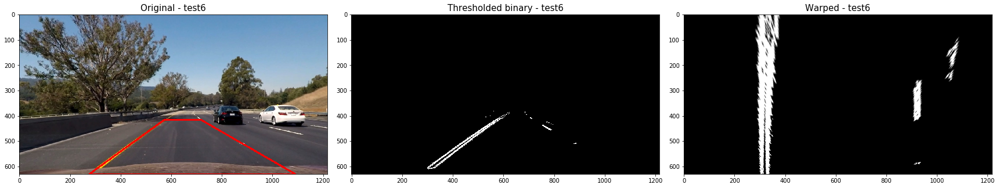

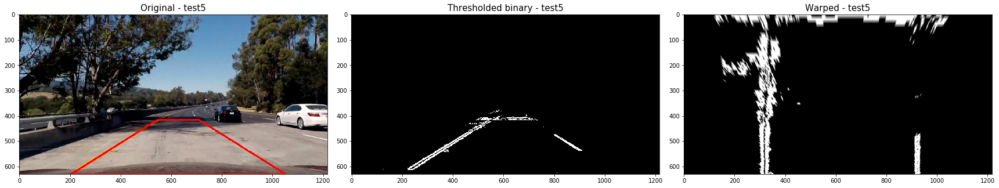

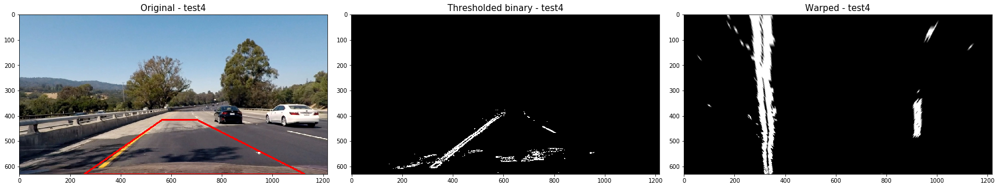

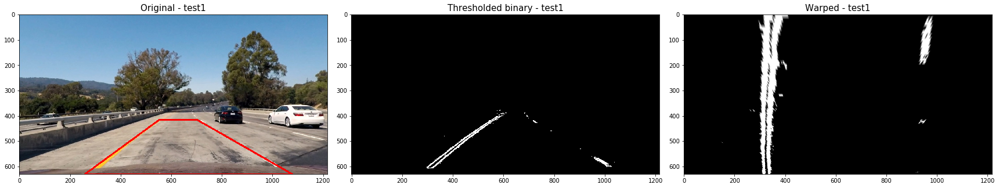

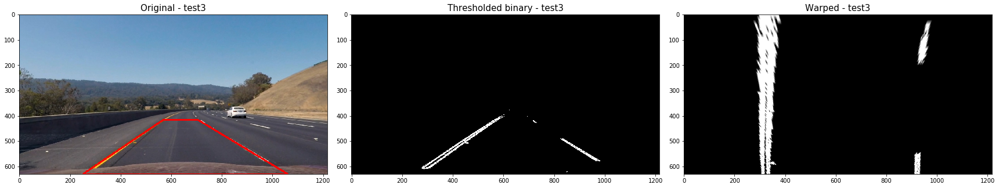

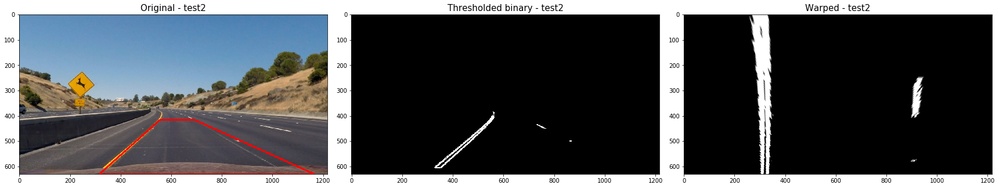

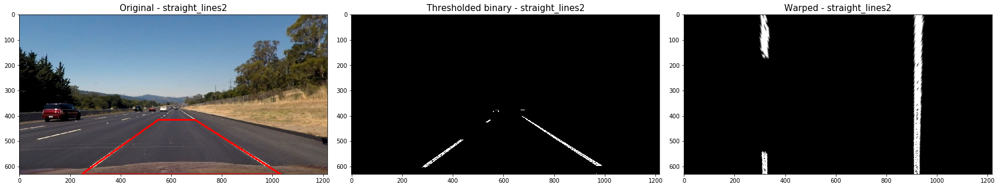

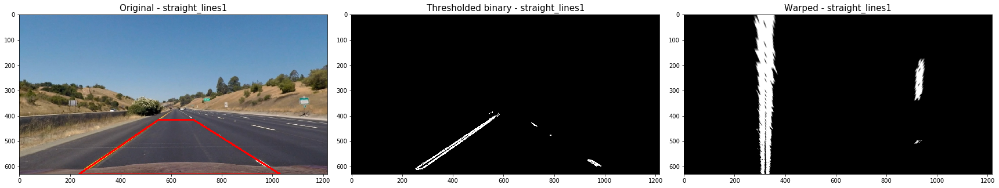

In [72]:
import matplotlib.cm as cm
def perspectiveTransform(img, thresholded):
    # Vertices extracted manually for performing a perspective transform
    
    lines = detectLanes(img)
    if len(lines) >1:
        left_line = lines[0]
        right_line = lines[1]
        
        bottom_left = left_line[2:]
        bottom_right = right_line[2:]
        top_left = left_line[:2]
        top_right = right_line[:2]
    else:
        bottom_left = [160,720]
        bottom_right = [1250, 720]
        top_left = [600, 400]
        top_right = [700, 400]
    h, w, b = img.shape
    source = np.float32([bottom_left,bottom_right,top_right,top_left])
    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    copy = img.copy()
    cv2.polylines(copy,[pts],True,(255,0,0), thickness=5)

    bottom_left = [320,720]
    bottom_right = [920, 720]
    top_left = [320, 1]
    top_right = [920, 1]

    dst = np.float32([bottom_left,bottom_right,top_right,top_left])
    M = cv2.getPerspectiveTransform(source, dst)
    M_inv = cv2.getPerspectiveTransform(dst, source)
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])

    warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)
    
    unwarped = cv2.warpPerspective(warped, M_inv, img_size , flags=cv2.INTER_LINEAR)
    
    return copy, warped, unwarped

nameRemove= len("undist_images/") 
test_images = glob.glob("undist_images/*")
for fname in test_images:
    image = mpimg.imread(fname)
    thresholded = getThresholdImage(image)
    img, warped, unwarped = perspectiveTransform(image, thresholded)
    warped.astype('uint8')
    plt.imsave("warped_images/" + fname[nameRemove:], warped, cmap=cm.gray)
#     cv2.imwrite("warped_images/" + fname[nameRemove:], warped*255)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original - ' + fname[nameRemove:-4], fontsize=15)    
    ax2.imshow(thresholded, cmap='gray')
    ax2.set_title('Thresholded binary - ' + fname[nameRemove:-4], fontsize=15)
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped - ' + fname[nameRemove:-4], fontsize=15)

# Find lane boundary
Detect lane pixels and fit to find the lane boundary.

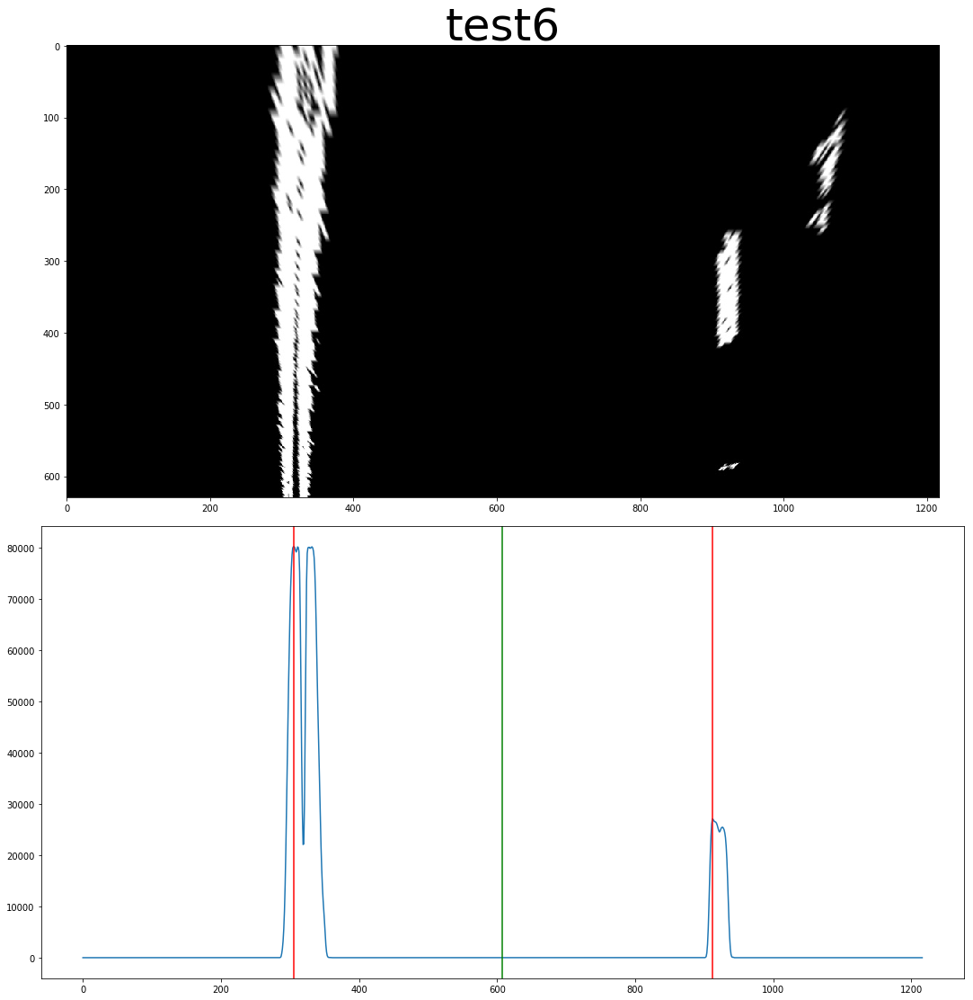

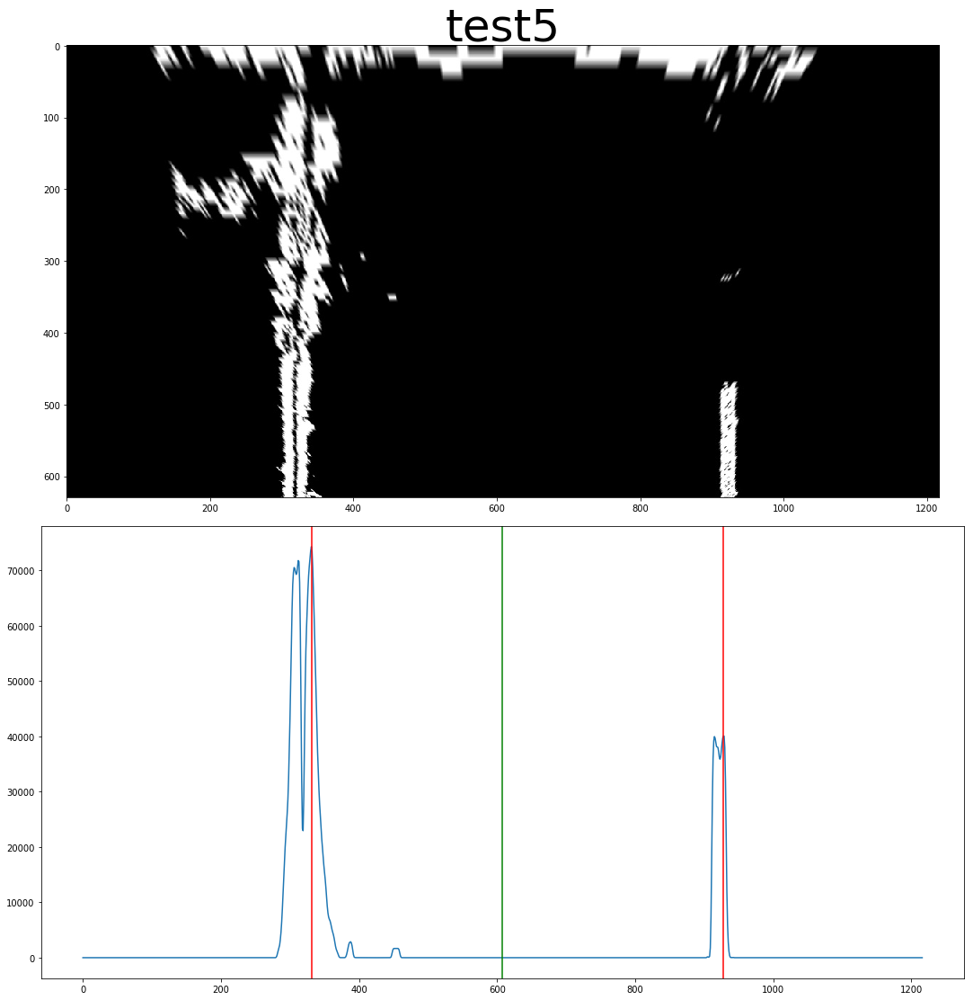

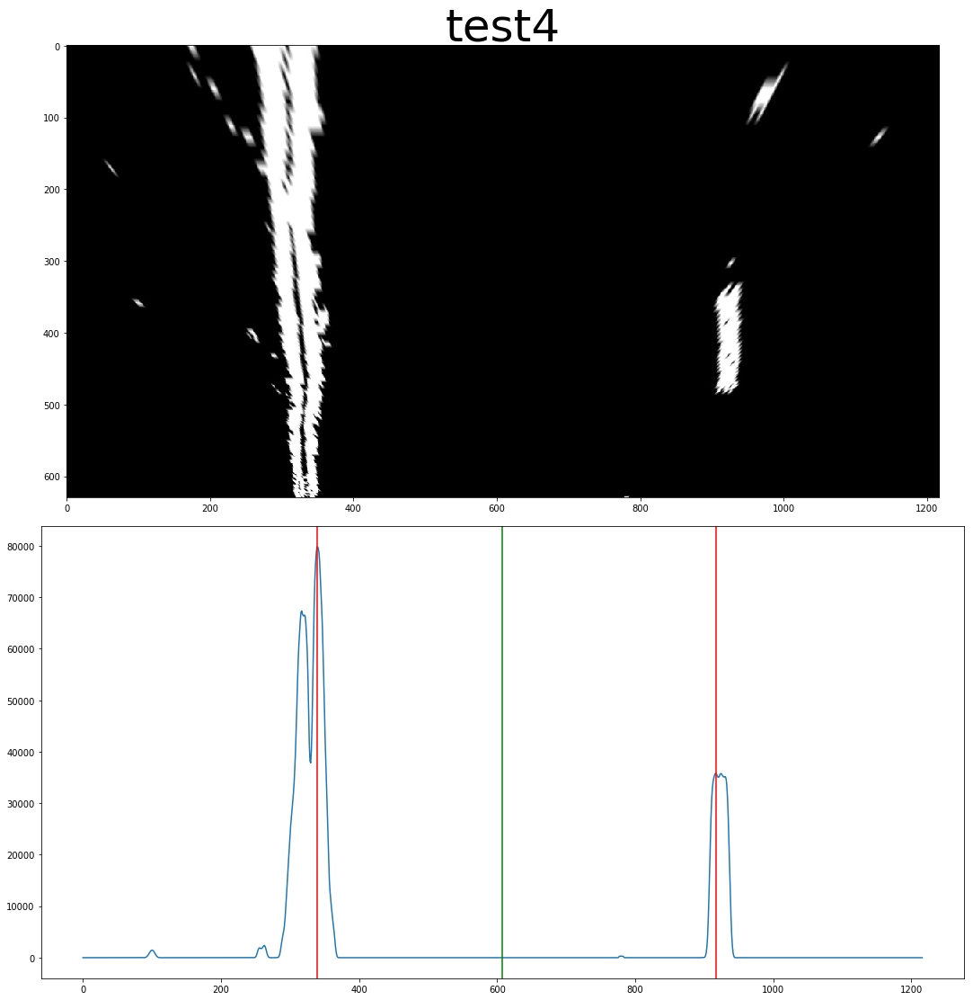

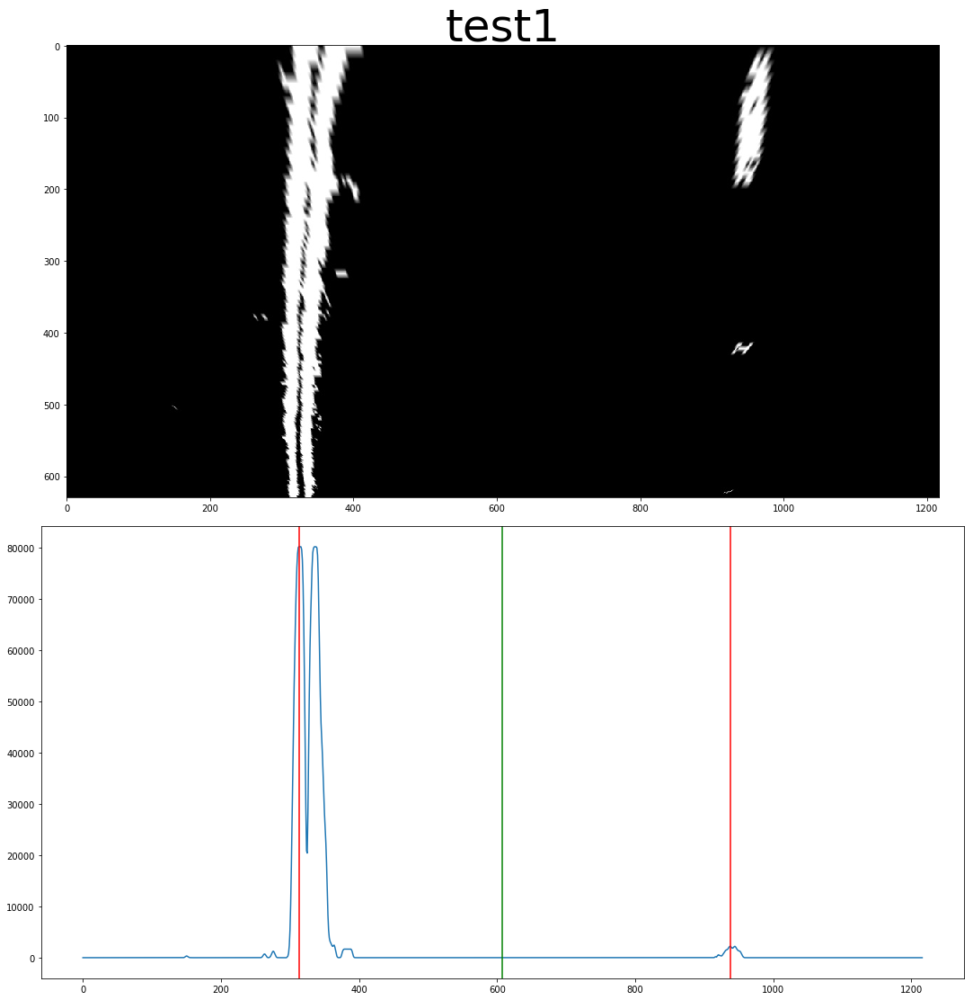

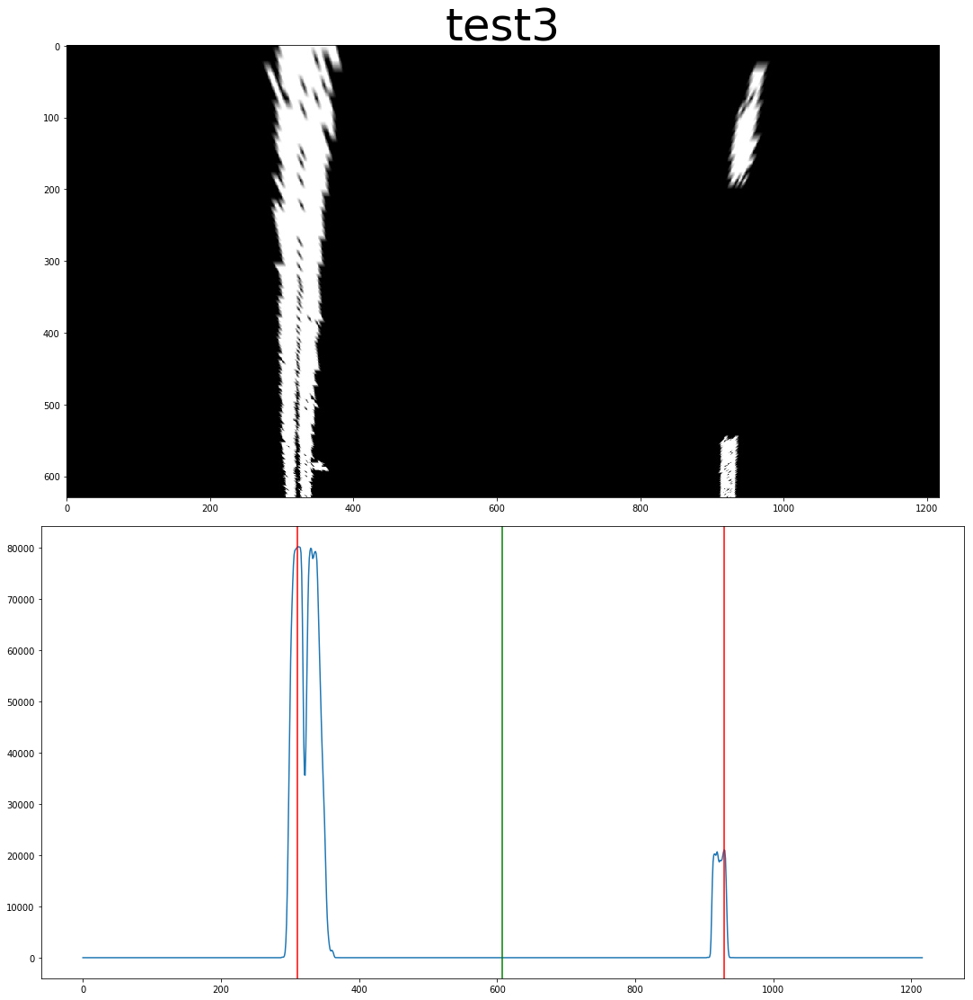

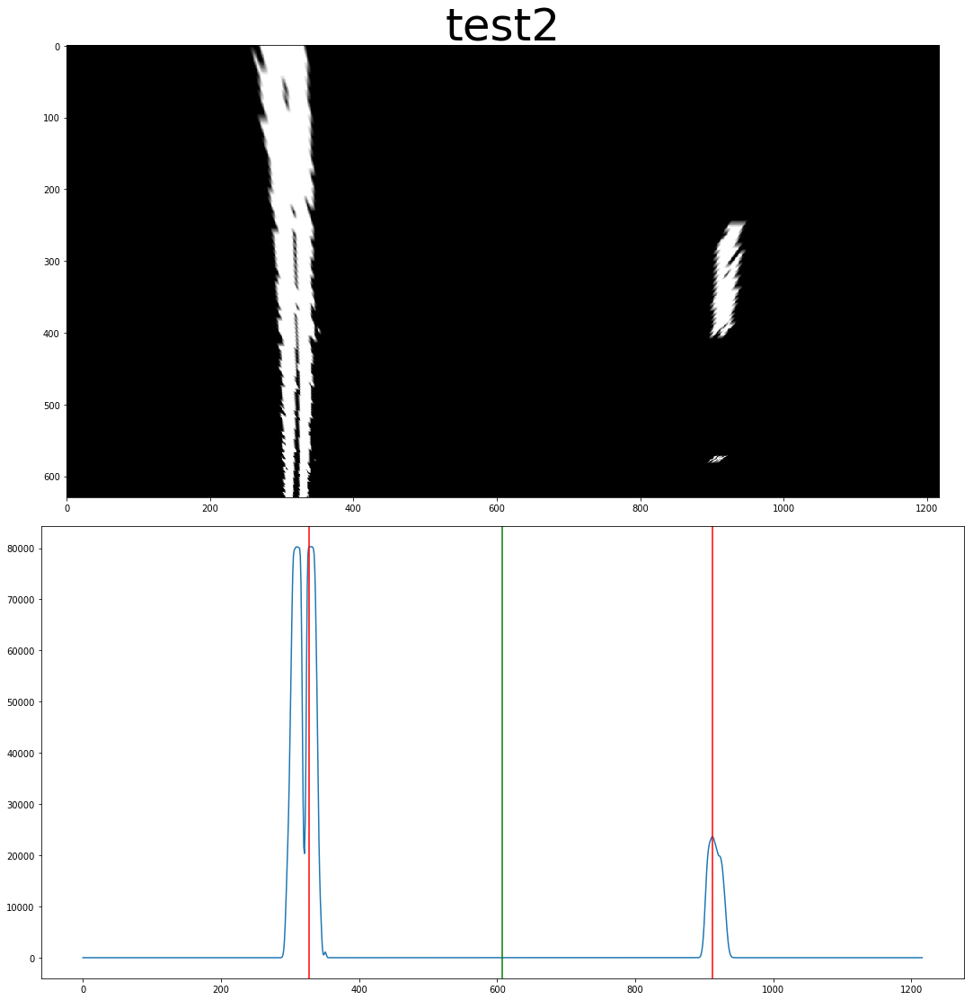

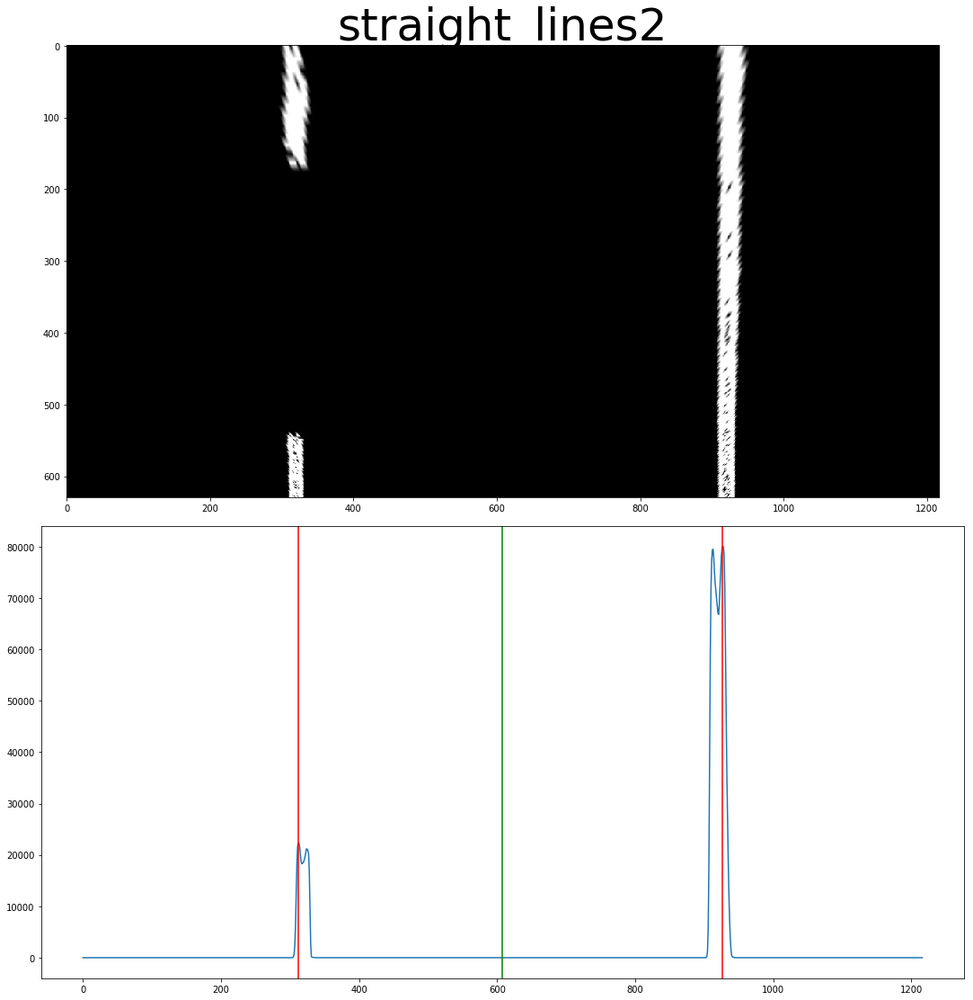

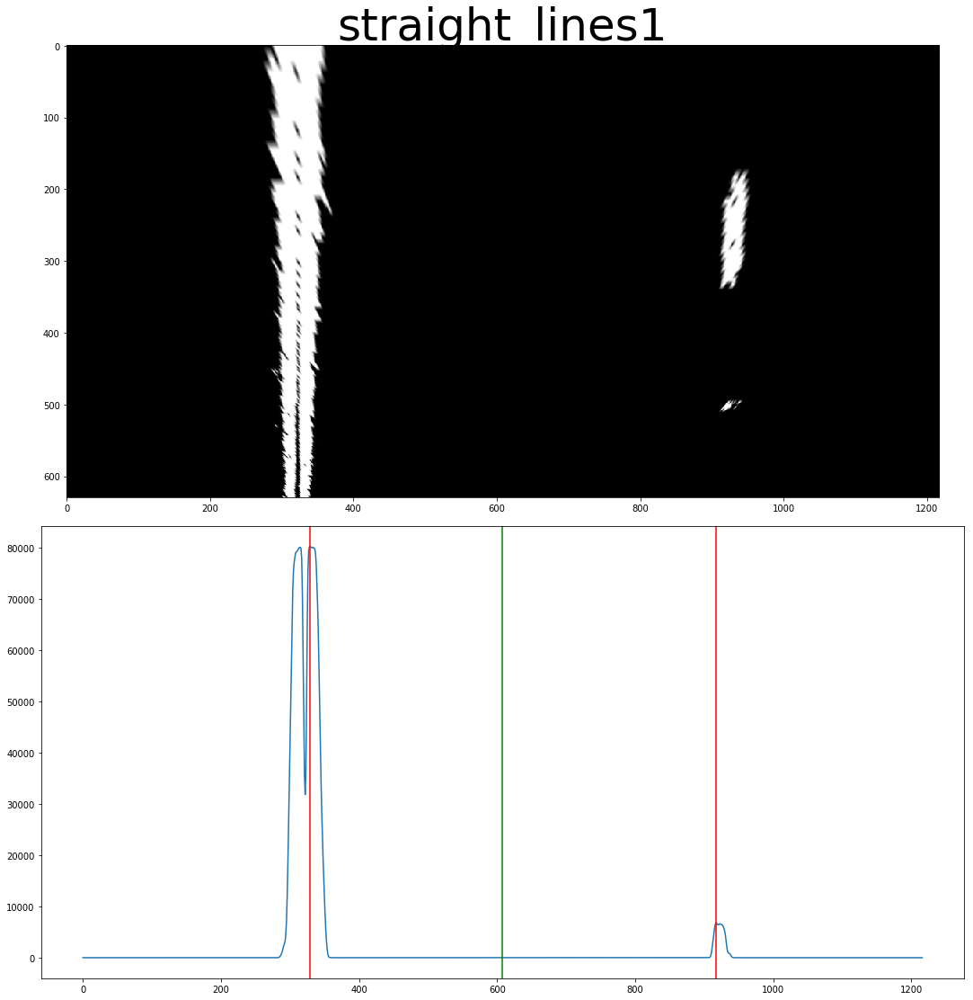

In [78]:
def plotHistogram(binary_warped):
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    return histogram, leftx_base, rightx_base

nameRemove= len("warped_images/") 
test_images = glob.glob("warped_images/*")
for fname in test_images:
    image = mpimg.imread(fname)
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title(fname[nameRemove:-4], fontsize=50)
    hist, leftx_base, rightx_base = plotHistogram(image[:, :, 0])
    ax2.plot(hist)
    plt.axvline(x=leftx_base, color = "r")
    plt.axvline(x=rightx_base, color = "r")
    plt.axvline(x=np.int(hist.shape[0]/2), color = "g")


# Lane Curvature
Determine the curvature of the lane and vehicle position with respect to center.

Warp the detected lane boundaries back onto the original image.

Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position